In [1]:
# linear algebra
import numpy as np 
import pandas as pd

#viz
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mlb
import matplotlib.image as mpimg
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

from IPython.display import display
import os
plt.style.use("seaborn")
%matplotlib inline  
import warnings
warnings.filterwarnings("ignore")

#theme
theme = ["#DEF5E5", "#459E97", "#4B9ABB","#0A4361","#E68193",]

In [2]:
df = pd.read_csv('media prediction and its cost.csv')

In [3]:
df.head()

,food_category,food_department,food_family,store_sales(in millions),store_cost(in millions),unit_sales(in millions),promotion_name,sales_country,marital_status,gender,...,grocery_sqft,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,media_type,cost
0,Breakfast Foods,Frozen Foods,Food,7.36,2.7232,4.0,Bag Stuffers,USA,M,F,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",126.62
1,Breakfast Foods,Frozen Foods,Food,5.52,2.5944,3.0,Cash Register Lottery,USA,M,M,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",59.86
2,Breakfast Foods,Frozen Foods,Food,3.68,1.3616,2.0,High Roller Savings,USA,S,F,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",84.16
3,Breakfast Foods,Frozen Foods,Food,3.68,1.1776,2.0,Cash Register Lottery,USA,M,F,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,In-Store Coupon,95.78
4,Breakfast Foods,Frozen Foods,Food,4.08,1.4280,3.0,Double Down Sale,USA,M,M,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,Radio,50.79


In [4]:
#describe the data with some visual style by applying T = Transpose and st#this gives us some general information on the dataset
#it shows us the count of each value, the mean of each value, standard deviation, percentiles and min/max valuesyle
df.describe().T.style.bar(subset=['mean'], color='#E68193')\
                            .background_gradient(subset=['std'], cmap='mako_r')\
                             .background_gradient(subset=['50%'], cmap='mako')

,count,mean,std,min,25%,50%,75%,max
store_sales(in millions),60428.000000,6.541031,3.463047,0.510000,3.810000,5.940000,8.670000,22.920000
store_cost(in millions),60428.000000,2.619460,1.453009,0.163200,1.500000,2.385600,3.484025,9.726500
unit_sales(in millions),60428.000000,3.093169,0.827677,1.000000,3.000000,3.000000,4.000000,6.000000
total_children,60428.000000,2.533875,1.490165,0.000000,1.000000,3.000000,4.000000,5.000000
avg_cars_at home(approx),60428.000000,2.200271,1.109644,0.000000,1.000000,2.000000,3.000000,4.000000
num_children_at_home,60428.000000,0.829351,1.303424,0.000000,0.000000,0.000000,1.000000,5.000000
avg_cars_at home(approx).1,60428.000000,2.200271,1.109644,0.000000,1.000000,2.000000,3.000000,4.000000
SRP,60428.000000,2.115258,0.932829,0.500000,1.410000,2.130000,2.790000,3.980000
gross_weight,60428.000000,13.806433,4.622693,6.000000,9.700000,13.600000,17.700000,21.900000
net_weight,60428.000000,11.796289,4.682986,3.050000,7.710000,11.600000,16.000000,20.800000


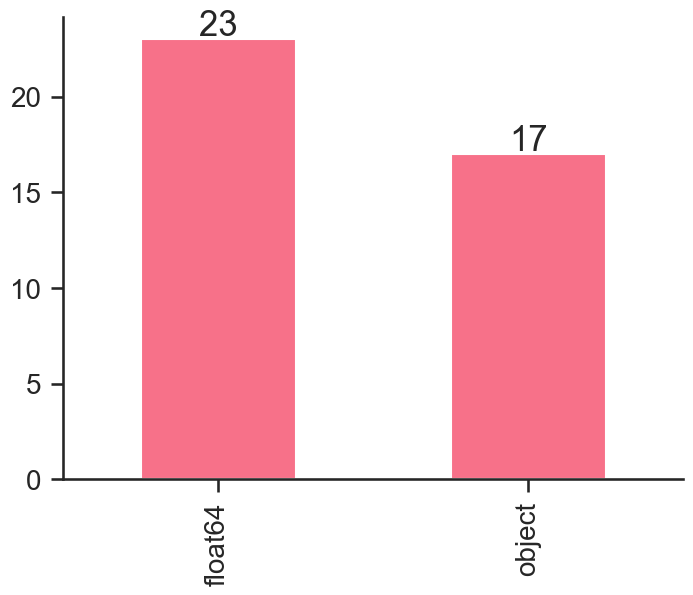

In [5]:
sns.set(style="ticks", context="talk",font_scale = 1,palette="husl")
plt.figure(figsize = (8,6))
ax = df.dtypes.value_counts().plot(kind='bar',grid = False,fontsize=20)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+ p.get_width() / 2., height + 0.2, height, ha = 'center', size = 25)
sns.despine()

# Data Cleaning

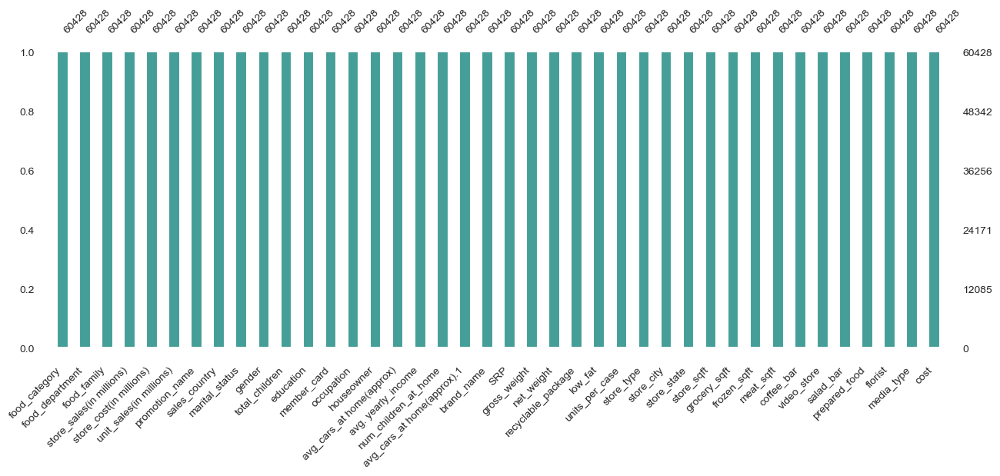

In [6]:
msno.bar(df,figsize=(15, 5),fontsize=10,color = '#459E97');

as we see that the data is cleaned so we donn have to do any terminologies to handle it

In [7]:
#checking missing values
missing = df.isnull().sum()
missing = missing[missing > 0]
missing

Series([], dtype: int64)

In [8]:
columns = df.columns
print("******************* Numeric field *******************\n")
for i in range(len(columns)):
    if df[columns[i]].dtypes!=object:
        print("unique number of {} -> {}".format(columns[i], len(df[columns[i]].unique())))
        
print("\n******************* Categorical field *******************\n")
for i in range(len(columns)):
    if df[columns[i]].dtypes==object:
        print("unique number of {} -> {}".format(columns[i], len(df[columns[i]].unique())))

******************* Numeric field *******************

unique number of store_sales(in millions) -> 1033
unique number of store_cost(in millions) -> 9919
unique number of unit_sales(in millions) -> 6
unique number of total_children -> 6
unique number of avg_cars_at home(approx) -> 5
unique number of num_children_at_home -> 6
unique number of avg_cars_at home(approx).1 -> 5
unique number of SRP -> 315
unique number of gross_weight -> 376
unique number of net_weight -> 332
unique number of recyclable_package -> 2
unique number of low_fat -> 2
unique number of units_per_case -> 36
unique number of store_sqft -> 20
unique number of grocery_sqft -> 20
unique number of frozen_sqft -> 20
unique number of meat_sqft -> 20
unique number of coffee_bar -> 2
unique number of video_store -> 2
unique number of salad_bar -> 2
unique number of prepared_food -> 2
unique number of florist -> 2
unique number of cost -> 328

******************* Categorical field *******************

unique number of food_c

In [9]:
unique_values = {column: list(df[column].unique()) for column in df.select_dtypes(object).columns}
for key, value in unique_values.items():
    print(f'{key} : {value}')

food_category : ['Breakfast Foods', 'Bread', 'Canned Shrimp', 'Baking Goods', 'Vegetables', 'Frozen Desserts', 'Candy', 'Snack Foods', 'Dairy', 'Starchy Foods', 'Cleaning Supplies', 'Decongestants', 'Meat', 'Hot Beverages', 'Jams and Jellies', 'Carbonated Beverages', 'Seafood', 'Specialty', 'Kitchen Products', 'Electrical', 'Beer and Wine', 'Candles', 'Fruit', 'Pure Juice Beverages', 'Canned Soup', 'Paper Products', 'Canned Tuna', 'Eggs', 'Hardware', 'Canned Sardines', 'Canned Clams', 'Pain Relievers', 'Side Dishes', 'Bathroom Products', 'Magazines', 'Frozen Entrees', 'Pizza', 'Cold Remedies', 'Canned Anchovies', 'Drinks', 'Hygiene', 'Plastic Products', 'Canned Oysters', 'Packaged Vegetables', 'Miscellaneous']
food_department : ['Frozen Foods', 'Baked Goods', 'Canned Foods', 'Baking Goods', 'Produce', 'Snacks', 'Snack Foods', 'Dairy', 'Starchy Foods', 'Household', 'Health and Hygiene', 'Meat', 'Beverages', 'Seafood', 'Deli', 'Alcoholic Beverages', 'Canned Products', 'Eggs', 'Periodical

In [10]:
#so as we see from the unique values of categorial features that we wnna make some text manipulation
for col in df.columns:
      if '$' in df[col].to_string():
            df[col + '_no_dollar'] = df[col].str.replace('$', '').str.replace(',', '')

In [11]:
df["media_type"].value_counts()

Daily Paper, Radio         6820
Product Attachment         5371
Daily Paper, Radio, TV     5284
Daily Paper                5119
Street Handout             5069
Radio                      4980
Sunday Paper               4859
In-Store Coupon            4495
Sunday Paper, Radio        4050
Cash Register Handout      4002
TV                         3576
Bulk Mail                  3457
Sunday Paper, Radio, TV    3346
Name: media_type, dtype: int64

In [12]:
df["low_fat"].unique()

array([0., 1.])

# Handling Outliers

In [13]:
df.columns

Index(['food_category', 'food_department', 'food_family',
       'store_sales(in millions)', 'store_cost(in millions)',
       'unit_sales(in millions)', 'promotion_name', 'sales_country',
       'marital_status', 'gender', 'total_children', 'education',
       'member_card', 'occupation', 'houseowner', 'avg_cars_at home(approx)',
       'avg. yearly_income', 'num_children_at_home',
       'avg_cars_at home(approx).1', 'brand_name', 'SRP', 'gross_weight',
       'net_weight', 'recyclable_package', 'low_fat', 'units_per_case',
       'store_type', 'store_city', 'store_state', 'store_sqft', 'grocery_sqft',
       'frozen_sqft', 'meat_sqft', 'coffee_bar', 'video_store', 'salad_bar',
       'prepared_food', 'florist', 'media_type', 'cost',
       'avg. yearly_income_no_dollar'],
      dtype='object')

so these outliers that we wanna handle

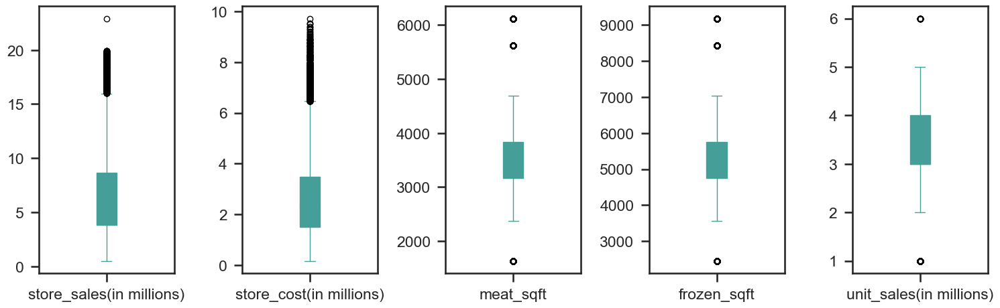

In [14]:
numeric_data=df[["store_sales(in millions)","store_cost(in millions)","meat_sqft","frozen_sqft","unit_sales(in millions)"]]
numeric_data.plot(subplots =True, kind = 'box', layout = (5,8), figsize = (30,30),patch_artist=True,color="#459E97")
plt.subplots_adjust(wspace = 0.5)
plt.style.use("ggplot")
plt.show()

In [15]:
def out_lairs(col):
    """
    this function take the name of column and compute the median(Q2)represent 50% percentage
    and also compute the Q3(75%)from the boxblot then compute the inter_quantile_range 
    and then we compute the upper limit and the lowerlimit to show the origin of the outlairs
    
    """
    Q1 = df[col].quantile(0.25)
    Q3 =  df[col].quantile(0.75)
    IQR = Q3-Q1
    data_out = df.loc[(df[col] < (Q1-1.5*IQR)) | (df[col] > (Q3+1.5*IQR))][:10]
    
    return data_out

In [16]:
out_lairs("store_sales(in millions)")

,food_category,food_department,food_family,store_sales(in millions),store_cost(in millions),unit_sales(in millions),promotion_name,sales_country,marital_status,gender,...,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,media_type,cost,avg. yearly_income_no_dollar
72,Breakfast Foods,Frozen Foods,Food,16.20,5.346,5.0,Two for One,USA,S,F,...,4923.0,3282.0,0.0,0.0,0.0,0.0,0.0,"Daily Paper, Radio, TV",57.52,50K - 70K
102,Breakfast Foods,Frozen Foods,Food,16.20,6.156,5.0,Weekend Markdown,USA,S,M,...,2452.0,1635.0,0.0,0.0,0.0,0.0,0.0,Daily Paper,140.57,50K - 70K
138,Breakfast Foods,Frozen Foods,Food,16.20,5.508,5.0,Two for One,Mexico,M,M,...,4819.0,3213.0,0.0,0.0,0.0,0.0,0.0,Cash Register Handout,123.63,130K - 150K
171,Breakfast Foods,Frozen Foods,Food,16.20,5.508,5.0,Price Slashers,Canada,S,M,...,4016.0,2678.0,1.0,1.0,1.0,1.0,1.0,"Sunday Paper, Radio, TV",77.24,70K - 90K
371,Bread,Baked Goods,Food,19.65,6.288,5.0,Dollar Cutters,USA,M,M,...,4746.0,3164.0,1.0,0.0,0.0,0.0,0.0,"Daily Paper, Radio, TV",144.18,30K - 50K
384,Bread,Baked Goods,Food,18.70,6.919,5.0,Shelf Clearing Days,USA,M,M,...,4746.0,3164.0,1.0,0.0,0.0,0.0,0.0,Radio,99.77,10K - 30K
407,Bread,Baked Goods,Food,19.30,7.141,5.0,Two for One,USA,M,M,...,4923.0,3282.0,0.0,0.0,0.0,0.0,0.0,"Daily Paper, Radio, TV",57.52,30K - 50K
457,Bread,Baked Goods,Food,18.70,6.358,5.0,Two for One,USA,M,M,...,4923.0,3282.0,0.0,0.0,0.0,0.0,0.0,"Daily Paper, Radio, TV",57.52,130K - 150K
673,Bread,Baked Goods,Food,19.65,8.253,5.0,Money Savers,Mexico,M,M,...,6393.0,4262.0,1.0,1.0,1.0,1.0,1.0,TV,65.70,130K - 150K
850,Bread,Baked Goods,Food,18.70,6.545,5.0,Price Slashers,Canada,M,F,...,4016.0,2678.0,1.0,1.0,1.0,1.0,1.0,"Sunday Paper, Radio, TV",77.24,30K - 50K


Text(0.5, 1.0, 'Correlation of Features')

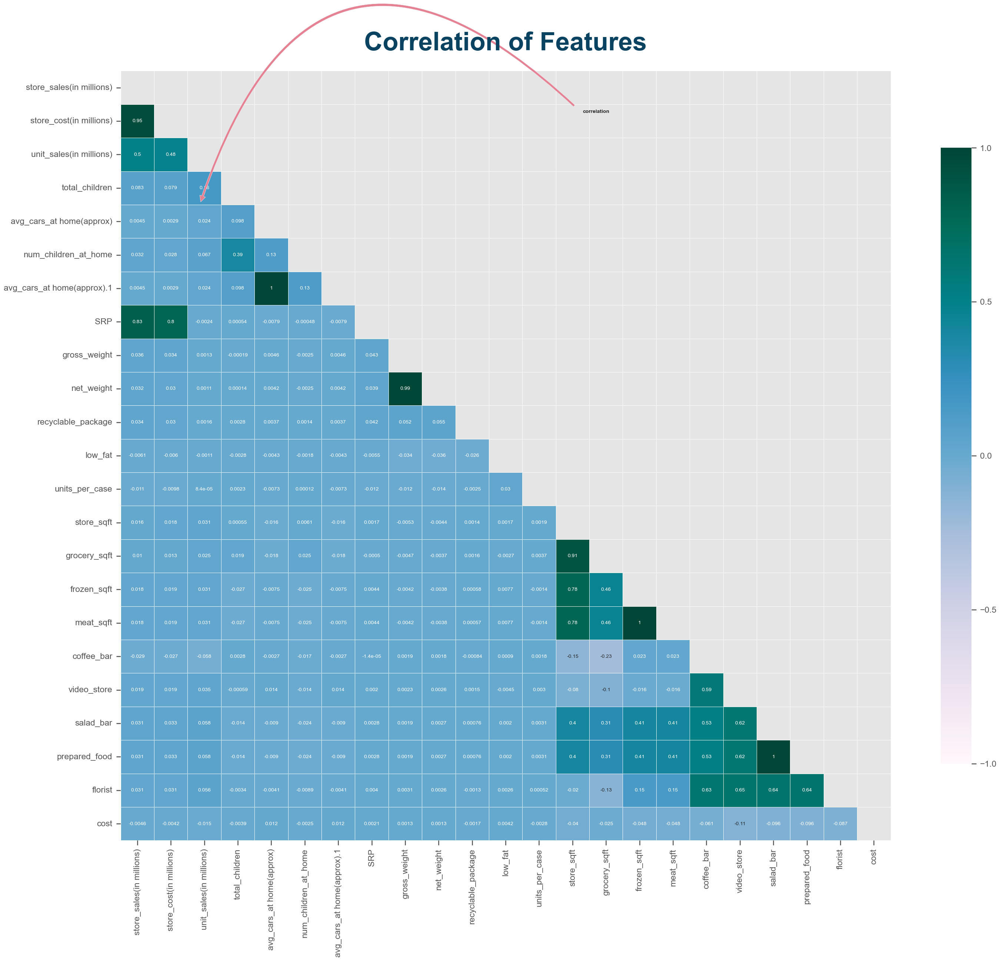

In [17]:
mask = np.zeros_like(df.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)]= True


fig, ax = plt.subplots(figsize=(35, 27))

heatmap = sns.heatmap(df.corr(),
                      mask = mask,
                      square = True,
                      linewidths = .7,
                      cmap = 'PuBuGn',
                      cbar_kws = {'shrink': .8,"ticks" : [-1, -0.5, 0, 0.5, 1]},
                      vmin = -1,
                      vmax = 1,
                      annot = True,
                      annot_kws = {"size": 10})

#add the column names as labels
ax.set_yticklabels(df.corr(), rotation = 0)
ax.set_xticklabels(df.corr())

sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

ax.annotate('correlation',
                    fontsize=10,fontweight='bold',
                    xy=(2.3, 4.2), xycoords='data',
                    xytext=(0.6, 0.95), textcoords='axes fraction',
                    arrowprops=dict(
                    facecolor=theme[4], shrink=0.025, 
                    connectionstyle='arc3, rad=0.80'),
                    horizontalalignment='left', verticalalignment='top'
)

ax.set_title('Correlation of Features', size = 50, color = theme[3], weight='bold', pad=40)

I choose the thresholds with 0.8 and -0.8 so features that greater than 0.8 or lesser than -0.8 are considered as strong positive correlation and strong negative correlation respectively

As the charts show that prepared_food and salad_bar are strong positive relationship (they have 1 for correlation point), avg_cars_at_home(approx) with avg_cars_at home(approx).1 for 1 followed by net_weight and gross_weight with 0.99
meat_sqft and frozen_sqft have strong correlation with 1

store_sales and store_cost also so a high correlation with 0.95 and grocery_sqft with store_sqft for 0.91

SRP has high correlation with store_sales and store_cost for 0.83 and 0.8 respectivvely

In conclusion, I chosed to remove salad_bar, gross_weight, avg_cars_at home(approx).1, store_sales, store_cost, meat_sqft, store_sqft

# Shapiro Wilk Normality Test

In [18]:
numeric_data=df.select_dtypes(exclude=["object"])
numeric_feature = df.dtypes!=object
final_numeric_feature = df.columns[numeric_feature].tolist()

In [19]:
from scipy.stats import shapiro
for i in range(len(final_numeric_feature)):
    stat,p = shapiro(df[final_numeric_feature[i]])
    print(final_numeric_feature[i])
    print('P_value=%.3f' % (p))
    print("*******************************")

store_sales(in millions)
P_value=0.000
*******************************
store_cost(in millions)
P_value=0.000
*******************************
unit_sales(in millions)
P_value=0.000
*******************************
total_children
P_value=0.000
*******************************
avg_cars_at home(approx)
P_value=0.000
*******************************
num_children_at_home
P_value=0.000
*******************************
avg_cars_at home(approx).1
P_value=0.000
*******************************
SRP
P_value=0.000
*******************************
gross_weight
P_value=0.000
*******************************
net_weight
P_value=0.000
*******************************
recyclable_package
P_value=0.000
*******************************
low_fat
P_value=0.000
*******************************
units_per_case
P_value=0.000
*******************************
store_sqft
P_value=0.000
*******************************
grocery_sqft
P_value=0.000
*******************************
frozen_sqft
P_value=0.000
*****************************

In Shapiro-Wilk Normality Test : H0 : The data are normally distributed

According to the P_value obtained from the Shapiro test (p_value &lt 5%), we reject our null hypothesis (H0) --> So the numerical fields do not follow the normal distribution.

as we see that we have skewness and outlairs lets analyisse the origin of these outalirs to see hoe we are gonna hadle it

In [20]:
numeric_data=df.select_dtypes(exclude=["object"])
numeric_data.shape

(60428, 23)

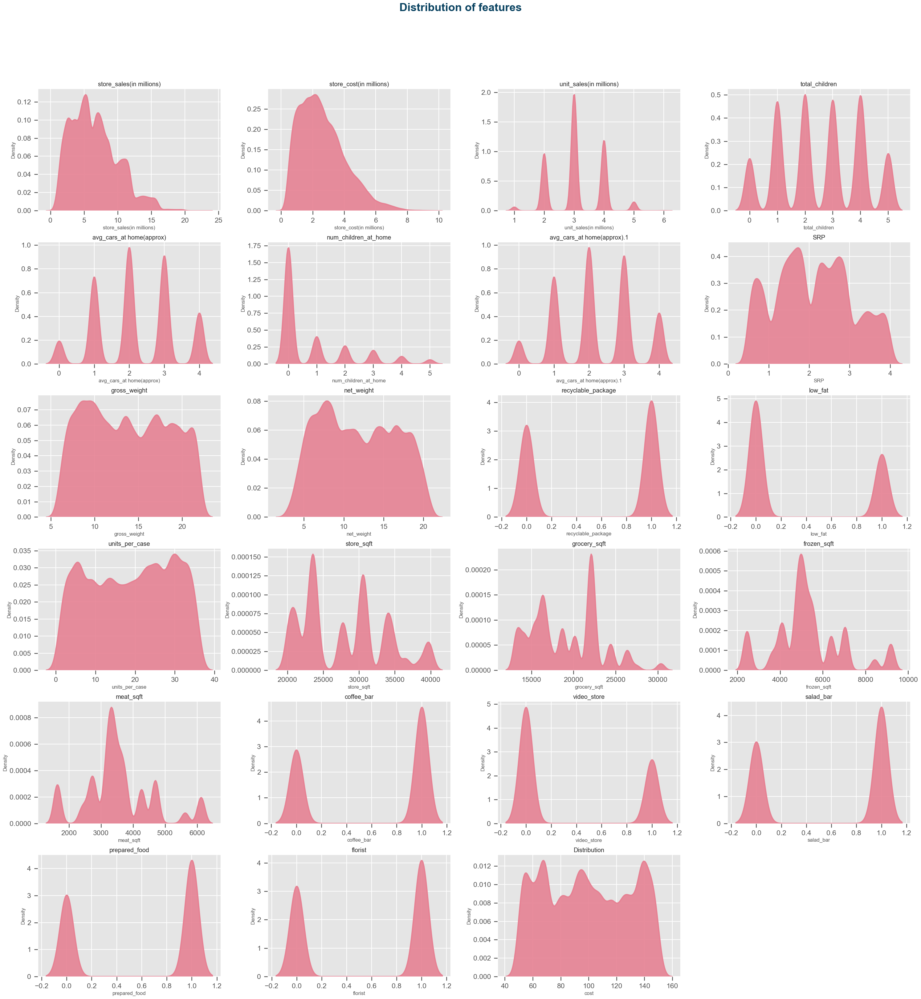

In [21]:
plt.figure(figsize = (30,30))
for ax, col in enumerate(numeric_data.columns[:24]):
    plt.subplot(6,4, ax + 1)
    plt.title(col)
    plotting = sns.kdeplot(x = numeric_data[col],fill=True, common_norm=False, color="#E68193",alpha=.9, linewidth=3);
    
plt.tight_layout()
plt.title('Distribution')
plotting.figure.suptitle(' Distribution of features ',y=1.08, size = 26, color = theme[3], weight='bold');

we can see here that there are categorial variables but in numerical features and we have a skewed fetures also

# Welch's t-test

H0: There are differences between lst_0 and lst_1 aka mean(lst_0) == mean(lst_1)

Ha: There are NO differences between lst0 and lst_1 aka mean(lst_0) != mean(lst_1)

In [22]:
from scipy.stats import ttest_ind
lst_cate = [ 'recyclable_package','low_fat', 'coffee_bar', 'video_store', 'prepared_food', 'florist']
alpha = .05
for i in lst_cate:
    lst_0 = df.cost[df[i] == 0]
    lst_1 = df.cost[df[i] == 1]
    t, p = ttest_ind(lst_0, lst_1, equal_var = False)
#--------------------------------------------------------------------------------
    print(f'p-value = {p:.2f}, alpha = {alpha:.2f}')
    if (p < alpha):
        print('p < alpha => reject H0 => there are differences between', i, 'and cost')
    else:
        print('p > alpha => failed to reject H0 => there are NO differences between', i, 'and cost')
    print('\n')

p-value = 0.67, alpha = 0.05
p > alpha => failed to reject H0 => there are NO differences between recyclable_package and cost


p-value = 0.30, alpha = 0.05
p > alpha => failed to reject H0 => there are NO differences between low_fat and cost


p-value = 0.00, alpha = 0.05
p < alpha => reject H0 => there are differences between coffee_bar and cost


p-value = 0.00, alpha = 0.05
p < alpha => reject H0 => there are differences between video_store and cost


p-value = 0.00, alpha = 0.05
p < alpha => reject H0 => there are differences between prepared_food and cost


p-value = 0.00, alpha = 0.05
p < alpha => reject H0 => there are differences between florist and cost




In [23]:
df["unit_sales"]=df["store_sales(in millions)"]-df["store_cost(in millions)"]
df["unit_sales"]

0        4.6368
1        2.9256
2        2.3184
3        2.5024
4        2.6520
          ...  
60423    1.4352
60424    1.1040
60425    2.9808
60426    5.7132
60427    4.9680
Name: unit_sales, Length: 60428, dtype: float64

# Exploratory Data Analysis

The main goal of this content is find the most features that affect to the prediction of cost to acquire a customer via media so I will focus on EDA and inferential analytics if necessary to explore the features

In [24]:
#from dataprep.datasets import load_dataset
#from dataprep.eda import create_report

#report=create_report(df)

#report.save("projectcost")
#report

# Univariate Analysis

In [25]:
import plotly.express as px
division_rat = px.pie(df, names='total_children', values='total_children', hole=0.6, title='Overall total children',
                      color_discrete_sequence=px.colors.qualitative.T10)
division_rat.update_traces(textfont=dict(color='#fff'))
division_rat.update_layout(autosize=True, height=300, width=800,
                           margin=dict(t=80, b=30, l=70, r=40),
                           plot_bgcolor='#2d3035', paper_bgcolor='#2d3035',
                           title_font=dict(size=25, color='#a5a7ab', family="Muli, sans-serif"),
                           font=dict(color='#8a8d93'),
                           legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
                           )

In [26]:
df["total_children"].value_counts()

2.0    12518
4.0    12427
3.0    11921
1.0    11770
5.0     6168
0.0     5624
Name: total_children, dtype: int64

# COUNT OF UNIT SALES ,WHAT IS THE higest ten food_category sold and food department?

In [27]:
import plotly.express as px
division_rat = px.pie(df, names='unit_sales(in millions)', values='unit_sales(in millions)', hole=0.7, title='Overall unit_sales',
                      color_discrete_sequence=px.colors.qualitative.T10)
division_rat.update_traces(textfont=dict(color='#fff'))
division_rat.update_layout(autosize=True, height=300, width=500,
                           margin=dict(t=80, b=30, l=70, r=40),
                           plot_bgcolor='#2d3035', paper_bgcolor='#2d3035',
                           title_font=dict(size=25, color='#a5a7ab', family="Muli, sans-serif"),
                           font=dict(color='#8a8d93'),
                           legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
                           )

# Bivariate Analysis

# Net Weight

In [28]:
df['net_weight'].min()

3.05

In [29]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
item_visibility_sales = df.groupby("net_weight")[["unit_sales"]].sum().sort_values(by=['unit_sales'],ascending=[False]).reset_index()
item_visibility_sales.sort_values(by=['unit_sales'],ascending=[False])

,net_weight,unit_sales
0,11.600,4292.688
1,16.200,4085.669
2,10.600,3642.903
3,18.700,3459.373
4,16.700,3296.681
...,...,...
327,6.640,44.218
328,6.150,42.331
329,7.170,41.652
330,5.210,39.161


In [30]:
fig = px.scatter(df,x='net_weight', y='unit_sales',color='net_weight')
fig.show()

# FOOD_CATEGORY

In [31]:
data=df.groupby("food_category")[["unit_sales(in millions)"]].sum().sort_values(by=['unit_sales(in millions)'],ascending=[False]).reset_index()
px.bar(data, x= 'food_category', y="unit_sales(in millions)",color='food_category',color_discrete_sequence=px.colors.qualitative.Bold)

# What is the most highest ten food_category achieve the highest net salary?

In [32]:
grp_product = df.groupby('food_category')
sales_by_product = grp_product['unit_sales'].mean().reset_index()
sales_by_product = sales_by_product.sort_values(by='unit_sales', ascending=False)
sales_by_product[:10]

,food_category,unit_sales
37,Plastic Products,4.839
34,Pain Relievers,4.698
11,Canned Shrimp,4.669
7,Canned Anchovies,4.657
19,Drinks,4.351
21,Electrical,4.320
43,Starchy Foods,4.243
29,Kitchen Products,4.225
23,Frozen Entrees,4.224
41,Snack Foods,4.135


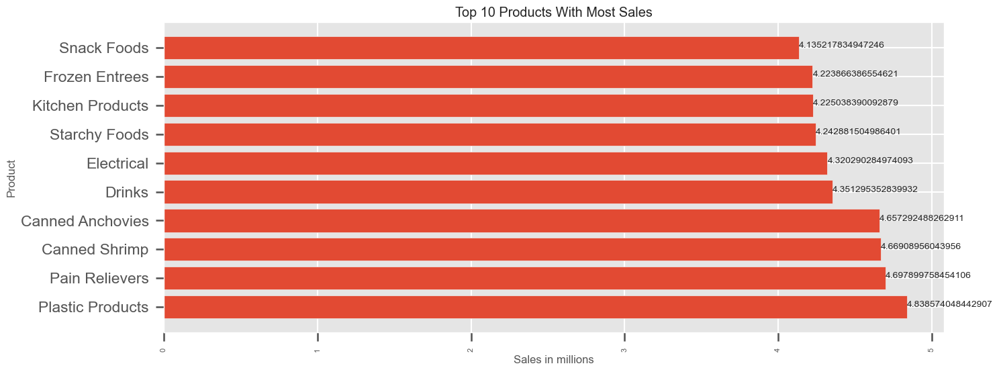

In [33]:
plt.figure(figsize=(15,6))
plt.barh(sales_by_product[:10]['food_category'], sales_by_product[:10]['unit_sales'])
plt.xticks(rotation='vertical', size=8)
plt.xlabel('Sales in millions')
plt.ylabel('Product')
plt.title('Top 10 Products With Most Sales')
for index, value in enumerate(sales_by_product[:10]['unit_sales']):
    plt.text(value, index,
             str(value))
plt.show()

as we see that the (pain relievers and plastic products and canned shrimp) achieve the highest net sales

# what is the three higest food category in each highest supermarket?

Text(0.5, 0.95, 'net salary of of each food category in Each super market')

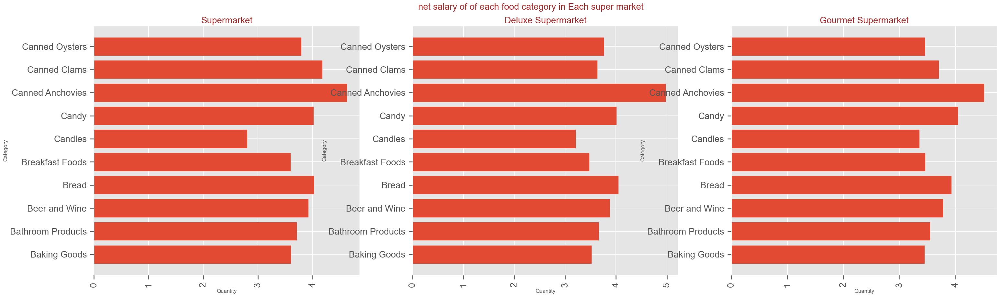

In [34]:
supermaret_store = df[df['store_type']=="Supermarket"] 
duluxe_supermaret_store = df[df['store_type']=="Deluxe Supermarket"] 
Gourmet_supermaret_store = df[df['store_type']=="Gourmet Supermarket"]
#Mid_Size_Grocery_store = data[data['store_type']=="Mid-Size Grocery"]
#Small_Grocery_store = data[data['store_type']=="Small Grocery"]

stores=["Supermarket","Deluxe Supermarket","Gourmet Supermarket"]
fig, ax = plt.subplots(1,3, figsize=(36,10))

for i,store in enumerate([supermaret_store , duluxe_supermaret_store, Gourmet_supermaret_store]):
    fig.sca(ax[i])
    df_category_quantity = store.groupby('food_category')['unit_sales'].mean().reset_index()
    df_category_quantity.sort_values(by='unit_sales', ascending=False)
    plt.barh(df_category_quantity[:10]['food_category'], df_category_quantity[:10]['unit_sales'])

    plt.xticks(rotation='vertical', size=20)
    plt.yticks(size=20)

    plt.xlabel('Quantity')
    plt.ylabel('Category')
    plt.title('net salary of of each food category   in Each super market')
    plt.title(stores[i], fontsize=20,color='brown') 
fig.suptitle('net salary of of each food category in Each super market',fontsize=20, color='brown', y=.95)

in the three highest supermarket sales the highest food category is cannedanchovies

In [35]:
food = df['food_family'].value_counts().reset_index()
food

,index,food_family
0,Food,43284
1,Non-Consumable,11573
2,Drink,5571


# WHAT IS THE HIGHEST FOOD FAMILY?

In [36]:
classname2 = px.histogram(df, x='food_family',
                         title='COUNT OF FOOD_FAMILY', height=300,width=600
                         ,color_discrete_sequence=['#03DAC5'],
                         )
classname2.update_yaxes(showgrid=False),
classname2.update_xaxes(categoryorder='total descending')
classname2.update_traces(hovertemplate=None)
classname2.update_layout(margin=dict(t=100, b=0, l=70, r=40),
                        hovermode="x unified",
                        xaxis_tickangle=360,
                        xaxis_title=' ', yaxis_title=" ",
                        plot_bgcolor='#2d3035', paper_bgcolor='#2d3035',
                        title_font=dict(size=25, color='#a5a7ab', family="Muli, sans-serif"),
                        font=dict(color='#8a8d93'),
                        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
                          )

as we see that the highest food family is food bc the most things the food mart selled is food.

# WHICH MARITAL STATUES MOST EFFECTIVE ON FOOD_FAMILY TYPES?

In [37]:
classname = px.histogram(df, x='food_family', color='marital_status',
                         title='FOOD_FAMILY BASED ON MARITAL STATUS',height=300,width=600,
                         category_orders={'marital_status': ['S', 'M']},
                         color_discrete_sequence=['#DB6574', '#03DAC5'],
                         )
classname.update_yaxes(showgrid=False),
classname.update_xaxes(categoryorder='total descending')
classname.update_traces(hovertemplate=None)
classname.update_layout(margin=dict(t=100, b=0, l=70, r=40),
                        hovermode="x unified",
                        xaxis_tickangle=360,
                        xaxis_title=' ', yaxis_title=" ",
                        plot_bgcolor='#2d3035', paper_bgcolor='#2d3035',
                        title_font=dict(size=25, color='#a5a7ab', family="Muli, sans-serif"),
                        font=dict(color='#8a8d93'),
                        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
                          )

in food ⁉ married is less than single

in non_consumble states: married is high than single

in Drink: married is high than single

# Products performing better and worse in Tier 1 cities v/s Tier 2 & 3 cities in terms of Sales?

In [38]:
top_region = df.groupby('sales_country')['unit_sales'].sum().sort_values(ascending=False).head(10)
top_region = top_region.reset_index()

In [39]:
import plotly.graph_objects as go
fig = go.Figure(go.Pie(labels=top_region.sales_country,
                             values = top_region.unit_sales,
                             customdata = top_region.unit_sales,
                            hovertemplate = "Region:%{label} <br> Sales: %{customdata} <extra></extra>",
                           pull= [0.1,0,0,0.1],
                           
                            ))

fig.update_layout(
                   title={
                        'text': "<b>Sales in different Regions",
                        'y':0.9,
                        'x':0.5,
                        'xanchor': 'center',
                        'yanchor': 'top'},
                 
                  )


fig.show()


as we see above that USA has the highest net salaries than the othe countries cause it has the most num stores

In [40]:
df_tier1=pd.DataFrame(df.loc[df['sales_country'] =='USA'])#for tier 1
df_tier2=pd.DataFrame(df.loc[df['sales_country'] =='Mexico']) #for tier 2
df_tier3=pd.DataFrame(df.loc[df['sales_country'] =='Canada']) #for tier 3
#df_cities=pd.concat([df_tier2,df_tier3],axis=0) #combining dfs for tier 2 & 3

In [41]:
df_tier1_list=df_tier1.groupby("food_department")[["cost"]].mean().sort_values(by=['cost'],ascending=[False]).reset_index()
df_tier1_list.rename(columns = {'food_department':'Items_Tier_1','cost':'Sales_of_usa'}, inplace = True)
df_tier1_list

,Items_Tier_1,Sales_of_usa
0,Checkout,101.306
1,Breakfast Foods,99.904
2,Canned Foods,99.501
3,Meat,99.470
4,Deli,99.273
5,Carousel,99.064
6,Snack Foods,98.970
7,Baked Goods,98.867
8,Eggs,98.854
9,Frozen Foods,98.837


In [42]:
df_tier2_list=df_tier2.groupby("food_department")[["cost"]].mean().sort_values(by=['cost'],ascending=[False]).reset_index()
df_tier2_list.rename(columns = {'food_department':'Items_Tier2','cost':'Sales_of_Mexico'}, inplace = True)
df_tier2_list

,Items_Tier2,Sales_of_Mexico
0,Periodicals,102.395
1,Canned Foods,102.146
2,Beverages,101.972
3,Baking Goods,101.732
4,Eggs,101.351
5,Health and Hygiene,101.145
6,Household,101.129
7,Snack Foods,100.796
8,Frozen Foods,100.785
9,Alcoholic Beverages,100.699


In [43]:
df_tier3_list=df_tier3.groupby("food_department")[["cost"]].mean().sort_values(by=['cost'],ascending=[False]).reset_index()
df_tier3_list.rename(columns = {'food_department':'Items_Tier3','cost':'Sales_of_canda'}, inplace = True)
df_tier3_list

,Items_Tier3,Sales_of_canda
0,Snacks,109.589
1,Periodicals,105.818
2,Canned Products,104.617
3,Health and Hygiene,103.927
4,Baked Goods,103.757
5,Breakfast Foods,102.233
6,Produce,101.861
7,Snack Foods,101.245
8,Frozen Foods,101.232
9,Deli,101.201


In [44]:
df_sales=pd.concat([df_tier1_list,df_tier2_list,df_tier3_list],axis=1)
df_sales

,Items_Tier_1,Sales_of_usa,Items_Tier2,Sales_of_Mexico,Items_Tier3,Sales_of_canda
0,Checkout,101.306,Periodicals,102.395,Snacks,109.589
1,Breakfast Foods,99.904,Canned Foods,102.146,Periodicals,105.818
2,Canned Foods,99.501,Beverages,101.972,Canned Products,104.617
3,Meat,99.470,Baking Goods,101.732,Health and Hygiene,103.927
4,Deli,99.273,Eggs,101.351,Baked Goods,103.757
5,Carousel,99.064,Health and Hygiene,101.145,Breakfast Foods,102.233
6,Snack Foods,98.970,Household,101.129,Produce,101.861
7,Baked Goods,98.867,Snack Foods,100.796,Snack Foods,101.245
8,Eggs,98.854,Frozen Foods,100.785,Frozen Foods,101.232
9,Frozen Foods,98.837,Alcoholic Beverages,100.699,Deli,101.201


# in each country which food department achieve highest net salary comparing to other coyuntries?

In [45]:
import plotly.graph_objects as go   #importing the library
x=df_sales['Items_Tier_1']
y1=df_sales['Sales_of_usa']
y2=df_sales['Sales_of_Mexico']
y3=df_sales['Sales_of_canda']

# Create traces

fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=y1,
                    mode='lines+markers',line_color='rgb(0,100,80)',
                    name='Sales_of_usa'))
fig.add_trace(go.Scatter(x=x, y=y2,
                    mode='lines+markers',
                    name='Sales_of_Mexico'))
fig.add_trace(go.Scatter(x=x, y=y3,
                    mode='lines+markers',
                    name='Sales_of_canda'))

fig.show()

as we see from above that CANADA has the highest net sales for every food department expect from Dairy food department become to decrease

and in canda we can see that it has the lowest net salaries comparing to the other countries expect snacks

in MEXICO we see that it is in the middle of salaries expect Backing Goods and and begin to have the highest salaries to periodicals

In [46]:
df_tier1_list=df_tier1.groupby("food_department")[["unit_sales"]].mean().sort_values(by=['unit_sales'],ascending=[False]).reset_index()
df_tier1_list.rename(columns = {'food_department':'Items_Tier_1','unit_sales':'Sales_of_usa'}, inplace = True)
df_tier1_list

,Items_Tier_1,Sales_of_usa
0,Starchy Foods,4.325
1,Snack Foods,4.125
2,Household,4.102
3,Seafood,4.029
4,Dairy,4.025
5,Produce,3.994
6,Eggs,3.969
7,Checkout,3.969
8,Baked Goods,3.946
9,Breakfast Foods,3.937


In [47]:
df_tier2_list=df_tier2.groupby("food_department")[["unit_sales"]].mean().sort_values(by=['unit_sales'],ascending=[False]).reset_index()
df_tier2_list.rename(columns = {'food_department':'Items_Tier2','unit_sales':'Sales_of_Mexico'}, inplace = True)
df_tier2_list

,Items_Tier2,Sales_of_Mexico
0,Snack Foods,4.164
1,Household,4.162
2,Produce,4.041
3,Dairy,4.025
4,Seafood,4.013
5,Starchy Foods,3.978
6,Snacks,3.972
7,Eggs,3.961
8,Periodicals,3.939
9,Baked Goods,3.925


In [48]:
df_tier3_list=df_tier3.groupby("food_department")[["unit_sales"]].mean().sort_values(by=['unit_sales'],ascending=[False]).reset_index()
df_tier3_list.rename(columns = {'food_department':'Items_Tier2','unit_sales':'Sales_of_canada'}, inplace = True)
df_tier3_list

,Items_Tier2,Sales_of_canada
0,Eggs,5.074
1,Starchy Foods,4.527
2,Snacks,4.261
3,Household,4.235
4,Meat,4.166
5,Snack Foods,4.108
6,Deli,4.013
7,Baked Goods,3.996
8,Produce,3.959
9,Breakfast Foods,3.927


In [49]:
df_sales=pd.concat([df_tier1_list,df_tier2_list,df_tier3_list],axis=1)
df_sales

,Items_Tier_1,Sales_of_usa,Items_Tier2,Sales_of_Mexico,Items_Tier2,Sales_of_canada
0,Starchy Foods,4.325,Snack Foods,4.164,Eggs,5.074
1,Snack Foods,4.125,Household,4.162,Starchy Foods,4.527
2,Household,4.102,Produce,4.041,Snacks,4.261
3,Seafood,4.029,Dairy,4.025,Household,4.235
4,Dairy,4.025,Seafood,4.013,Meat,4.166
5,Produce,3.994,Starchy Foods,3.978,Snack Foods,4.108
6,Eggs,3.969,Snacks,3.972,Deli,4.013
7,Checkout,3.969,Eggs,3.961,Baked Goods,3.996
8,Baked Goods,3.946,Periodicals,3.939,Produce,3.959
9,Breakfast Foods,3.937,Baked Goods,3.925,Breakfast Foods,3.927


In [50]:
import plotly.graph_objects as go   #importing the library
x=df_sales['Items_Tier_1']
y1=df_sales['Sales_of_usa']
y2=df_sales['Sales_of_Mexico']
y3=df_sales['Sales_of_canada']

# Create traces

fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=y1,
                    mode='lines+markers',line_color='rgb(0,100,80)',
                    name='Sales_of_usa'))
fig.add_trace(go.Scatter(x=x, y=y2,
                    mode='lines+markers',
                    name='Sales_of_Mexico'))
fig.add_trace(go.Scatter(x=x, y=y3,
                    mode='lines+markers',
                    name='Sales_of_canda'))

fig.show()

as we see from above that CANADA has the highest net sales for starchy food and snack food department except from canned products department become to decrease

# what is the highest cities according to net sales?what is the highest cities according to net sales?

In [51]:
top_region = df.groupby('store_city')['unit_sales'].mean().sort_values(ascending=False).head(10)
top_region = top_region.reset_index()

In [52]:
fig = go.Figure(go.Pie(labels=top_region.store_city,
                             values = top_region.unit_sales,
                             customdata = top_region.unit_sales,
                            hovertemplate = "Region:%{label} <br> Sales: %{customdata} <extra></extra>",
                           pull= [0.1,0,0,0.1],
                           
                            ))

fig.update_layout(
                   title={
                        'text': "<b>Sales in different Regions",
                        'y':0.9,
                        'x':0.5,
                        'xanchor': 'center',
                        'yanchor': 'top'},
                 
                  )


fig.show()

the highest two cities according to net sales is portland and merida

In [53]:
df_tier1=pd.DataFrame(df.loc[df['store_city'] =='Tacoma'])#for tier 1
df_tier2=pd.DataFrame(df.loc[df['store_city'] =='Portland']) #for tier 2
df_tier3=pd.DataFrame(df.loc[df['store_city'] =='Seattle']) #for tier 3
df_cities=pd.concat([df_tier2,df_tier3],axis=0) #combining dfs for tier 2 & 3

In [54]:
df_tier1_list=df_tier1.groupby("food_department")[["unit_sales"]].sum().sort_values(by=['unit_sales'],ascending=[False]).reset_index()
df_tier1_list.rename(columns = {'food_department':'Items_Tier_1','unit_sales':'Sales_tier_1'}, inplace = True)

In [55]:
df_cities_list=df_cities.groupby("food_department")[["unit_sales"]].sum().sort_values(by=['unit_sales'],ascending=[False]).reset_index()
df_cities_list.rename(columns = {'food_department':'Items_Tier2_3','unit_sales':'Sales_tier2_3'}, inplace = True)

In [56]:
df3_sales=pd.concat([df_tier1_list,df_cities_list],axis=1)
df3_sales

,Items_Tier_1,Sales_tier_1,Items_Tier2_3,Sales_tier2_3
0,Produce,3310.340,Produce,5848.674
1,Snack Foods,2588.700,Snack Foods,5080.282
2,Household,2424.999,Household,4384.266
3,Frozen Foods,2351.870,Frozen Foods,4028.983
4,Baking Goods,1607.119,Canned Foods,2729.122
5,Canned Foods,1551.089,Dairy,2726.800
6,Dairy,1473.343,Baking Goods,2671.489
7,Health and Hygiene,1410.649,Health and Hygiene,2550.390
8,Beverages,1120.764,Deli,1998.781
9,Deli,976.781,Beverages,1756.473


In [57]:
import plotly.graph_objects as go   #importing the library
x=df3_sales['Items_Tier_1']
y1=df3_sales['Sales_tier_1']
y2=df3_sales['Sales_tier2_3']

# Create traces

fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=y1,
                    mode='lines+markers',line_color='rgb(0,100,80)',
                    name='Tacoma sales'))
fig.add_trace(go.Scatter(x=x, y=y2,
                    mode='lines+markers',
                    name='Portland AND Seattle sales'))

fig.show()


In [58]:
df_tier1_list=df_tier1.groupby("food_department")[["cost"]].sum().sort_values(by=['cost'],ascending=[False]).reset_index()
df_tier1_list.rename(columns = {'food_department':'Items_Tier_1','cost':'Sales_tier_1'}, inplace = True)

In [59]:
df_cities_list=df_cities.groupby("food_department")[["cost"]].sum().sort_values(by=['cost'],ascending=[False]).reset_index()
df_cities_list.rename(columns = {'food_department':'Items_Tier2_3','cost':'Sales_tier2_3'}, inplace = True)

In [60]:
df_sales=pd.concat([df_tier1_list,df_cities_list],axis=1)
df_sales

,Items_Tier_1,Sales_tier_1,Items_Tier2_3,Sales_tier2_3
0,Produce,78877.630,Produce,148866.540
1,Frozen Foods,60671.430,Snack Foods,124831.490
2,Snack Foods,60426.050,Frozen Foods,111532.940
3,Household,55489.220,Household,107777.820
4,Baking Goods,44282.790,Baking Goods,76650.790
5,Canned Foods,39356.360,Canned Foods,76555.460
6,Dairy,36122.980,Health and Hygiene,66211.650
7,Health and Hygiene,35746.410,Dairy,66183.500
8,Beverages,28394.320,Deli,50831.340
9,Deli,25747.330,Beverages,49155.040


In [61]:
import plotly.graph_objects as go   #importing the library
x=df_sales['Items_Tier_1']
y1=df_sales['Sales_tier_1']
y2=df_sales['Sales_tier2_3']

# Create traces

fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=y1,
                    mode='lines+markers',line_color='rgb(0,100,80)',
                    name='Tacoma sales'))
fig.add_trace(go.Scatter(x=x, y=y2,
                    mode='lines+markers',
                    name='Portland AND Seattle sales'))

fig.show()

In [62]:
store_type_relation = df.groupby("store_type")[["unit_sales"]].mean().sort_values(by=['unit_sales'],ascending=[False]).reset_index()
px.bar(store_type_relation, x= 'store_type', y="unit_sales",color='store_type',color_discrete_sequence=px.colors.qualitative.Pastel1)

In [63]:
duluxe_supermaret_store["promotion_name"].value_counts()

Cash Register Lottery     1555
Price Savers              1274
Double Down Sale          1158
Super Duper Savers        1090
Bag Stuffers              1009
Price Winners              975
Dimes Off                  926
One Day Sale               870
Money Savers               812
I Cant Believe It Sale     780
Price Slashers             762
Green Light Days           723
Big Promo                  682
Super Savers               639
Two Day Sale               626
Save-It Sale               620
Tip Top Savings            616
Sales Galore               578
Free For All               560
Sale Winners               532
Two for One                518
Shelf Clearing Days        506
Go For It                  460
Big Time Savings           438
Pick Your Savings          424
Three for One              405
Dollar Days                404
Big Time Discounts         391
Price Cutters              282
Price Smashers             278
Bye Bye Baby               263
Price Destroyers           258
Saving D

Text(0.5, 0.98, 'net salary of of each poromotion  in Each super market')

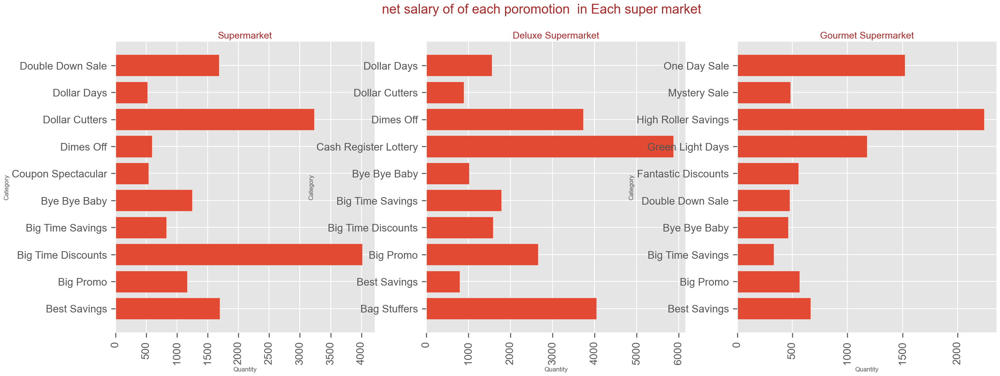

In [64]:
supermaret_store = df[df['store_type']=="Supermarket"] 
duluxe_supermaret_store = df[df['store_type']=="Deluxe Supermarket"] 
Gourmet_supermaret_store = df[df['store_type']=="Gourmet Supermarket"]
#Mid_Size_Grocery_store = data[data['store_type']=="Mid-Size Grocery"]
#Small_Grocery_store = data[data['store_type']=="Small Grocery"]

stores=["Supermarket","Deluxe Supermarket","Gourmet Supermarket"]
fig, ax = plt.subplots(1,3, figsize=(30,10))

for i,store in enumerate([supermaret_store , duluxe_supermaret_store, Gourmet_supermaret_store]):
    fig.sca(ax[i])
    df_category_quantity = store.groupby('promotion_name')['unit_sales'].sum().reset_index()
    df_category_quantity.sort_values(by='unit_sales', ascending=False)
    plt.barh(df_category_quantity[:10]['promotion_name'], df_category_quantity[:10]['unit_sales'])

    plt.xticks(rotation='vertical', size=20)
    plt.yticks(size=20)
    plt.xlabel('Quantity')
    plt.ylabel('Category')
    #plt.title(stores[i], fontsize=15,color='brown')
    #plt.title('net salary of of each poromotion  in Each super market')
    plt.title(stores[i], fontsize=18,color='brown') 
fig.suptitle('net salary of of each poromotion  in Each super market',fontsize=25, color='brown', y=.98)


in Supermarkets: the best two promotion are Big Time Discounts and Dollar Cutters.
in Deluxe Supermarkets: the best two promotion are Cash Register Lottery and Bag Stuffers.
in Gourmet Supermarkets: the best two promotion are High Roller Savings and One Day Sale

In [65]:
data=df[df["store_type"]=="Supermarket"]
data["store_city"].value_counts()

Portland       5150
Seattle        5051
Spokane        4453
Los Angeles    3960
Bremerton      3451
Orizaba        2621
Acapulco       1506
Name: store_city, dtype: int64

In [66]:
df["store_type"].value_counts()

Supermarket            26192
Deluxe Supermarket     22954
Gourmet Supermarket     6503
Mid-Size Grocery        2846
Small Grocery           1933
Name: store_type, dtype: int64

# what is the highest promotion based on sales ?

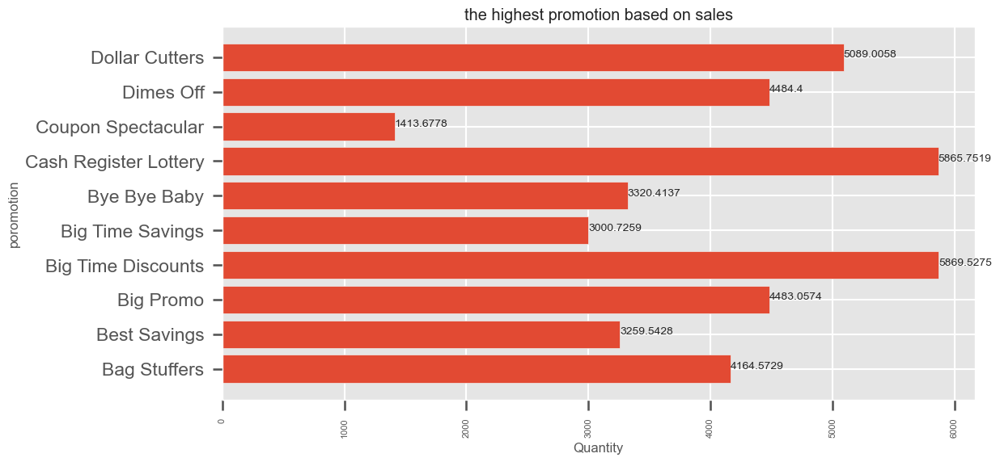

In [67]:
df_category_quantity = df.groupby('promotion_name')['unit_sales'].sum().reset_index()
df_category_quantity.sort_values(by='unit_sales', ascending=False)
plt.figure(figsize=(12,6))
plt.barh(df_category_quantity[:10]['promotion_name'], df_category_quantity[:10]['unit_sales'])

plt.xticks(rotation='vertical', size=8)
plt.xlabel('Quantity')
plt.ylabel('poromotion')
plt.title('the highest promotion based on sales')
for index, value in enumerate(df_category_quantity[:10]['unit_sales']):
    plt.text(value, index,
             str(value))

plt.show()

the best 4 promotions is Big Time Discount , Cash register lottery , Dollar cutters and Dimes off

# what is the best food department in each supermarket type ?

Text(0.5, 0.95, 'net salary of of each food department in Each super market')

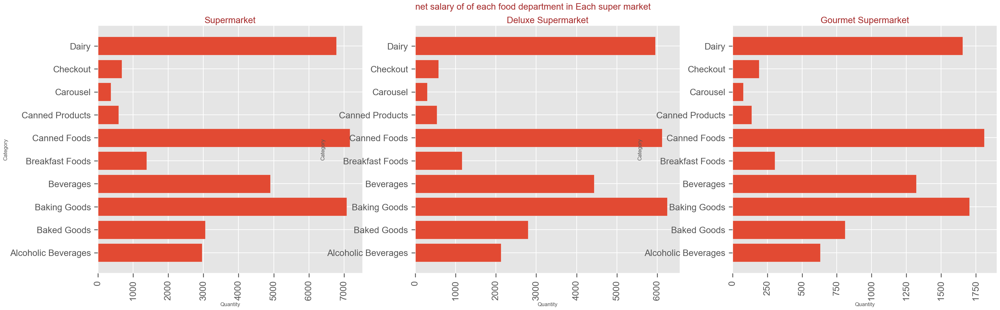

In [68]:
supermaret_store = df[df['store_type']=="Supermarket"] 
duluxe_supermaret_store = df[df['store_type']=="Deluxe Supermarket"] 
Gourmet_supermaret_store = df[df['store_type']=="Gourmet Supermarket"]
#Mid_Size_Grocery_store = data[data['store_type']=="Mid-Size Grocery"]
#Small_Grocery_store = data[data['store_type']=="Small Grocery"]

stores=["Supermarket","Deluxe Supermarket","Gourmet Supermarket"]
fig, ax = plt.subplots(1,3, figsize=(36,10))

for i,store in enumerate([supermaret_store , duluxe_supermaret_store, Gourmet_supermaret_store]):
    fig.sca(ax[i])
    df_category_quantity = store.groupby('food_department')['unit_sales'].sum().reset_index()
    df_category_quantity.sort_values(by='unit_sales', ascending=False)
    plt.barh(df_category_quantity[:10]['food_department'], df_category_quantity[:10]['unit_sales'])

    plt.xticks(rotation='vertical', size=20)
    plt.yticks(size=20)

    plt.xlabel('Quantity')
    plt.ylabel('Category')
    plt.title('net salary of of each food department  in Each super market')
    plt.title(stores[i], fontsize=20,color='brown') 
fig.suptitle('net salary of of each food department in Each super market',fontsize=20, color='brown', y=.95)

dairy and canned food and baking good is the most three department in each supermarket
carousel and checkout and canned products is the least three food department

# what is the best five food department according to net sales?

In [69]:
food_department_relation = df.groupby("food_department")[["unit_sales"]].sum().sort_values(by=['unit_sales'],ascending=[False]).reset_index()
px.bar(food_department_relation, x= 'food_department', y="unit_sales",color='food_department',color_discrete_sequence=px.colors.qualitative.Set3)

the best five department is produce, snake foods , houshold , frozen foods and canned foods

member_card with unit_sales

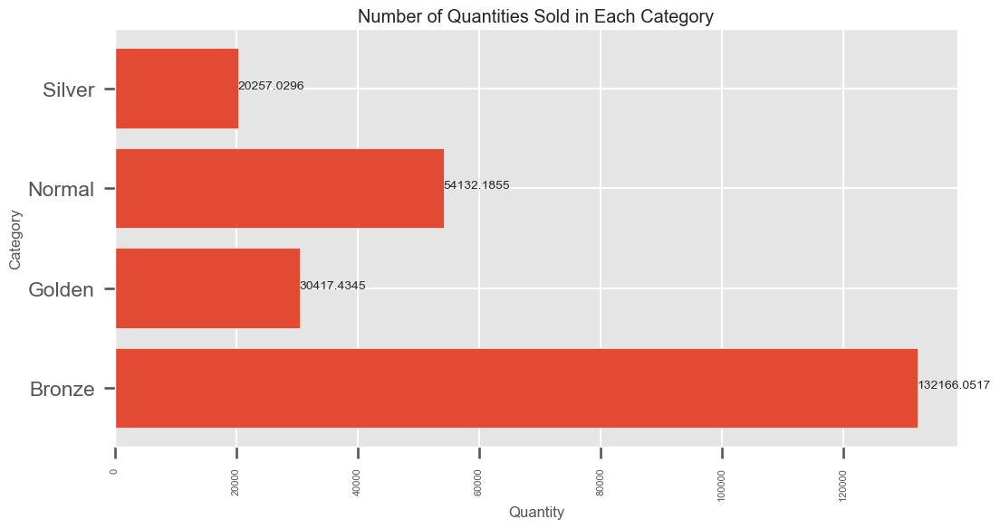

In [70]:
df_category_quantity = df.groupby('member_card')['unit_sales'].sum().reset_index()
df_category_quantity.sort_values(by='unit_sales', ascending=False)
plt.figure(figsize=(12,6))
plt.barh(df_category_quantity[:10]['member_card'], df_category_quantity[:10]['unit_sales'])

plt.xticks(rotation='vertical', size=8)
plt.xlabel('Quantity')
plt.ylabel('Category')
plt.title('Number of Quantities Sold in Each Category')
for index, value in enumerate(df_category_quantity[:10]['unit_sales']):
    plt.text(value, index,
             str(value))
plt.show()

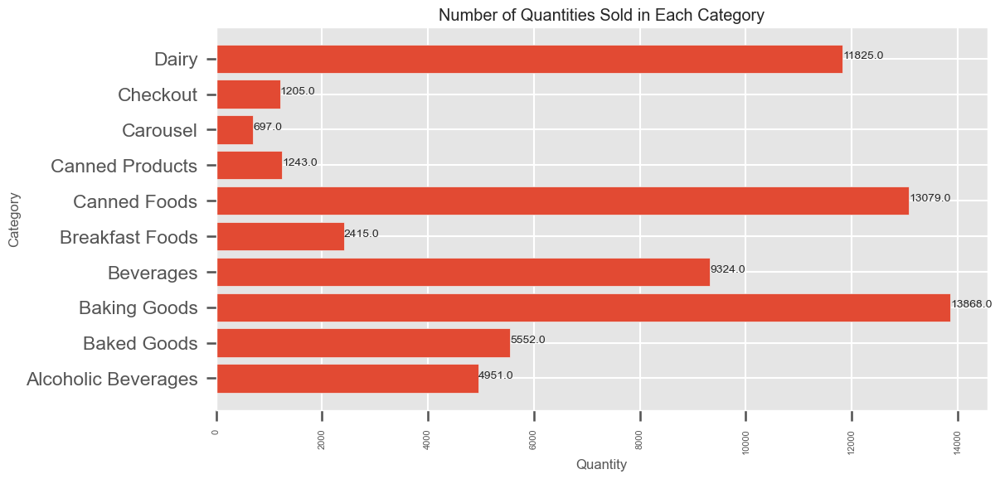

In [71]:
df_category_quantity = df.groupby('food_department')['unit_sales(in millions)'].sum().reset_index()
df_category_quantity.sort_values(by='unit_sales(in millions)', ascending=False)
plt.figure(figsize=(12,6))
plt.barh(df_category_quantity[:10]['food_department'], df_category_quantity[:10]['unit_sales(in millions)'])

plt.xticks(rotation='vertical', size=8)
plt.xlabel('Quantity')
plt.ylabel('Category')
plt.title('Number of Quantities Sold in Each Category')
for index, value in enumerate(df_category_quantity[:10]['unit_sales(in millions)']):
    plt.text(value, index,
             str(value))
plt.show()

the baking goods department achieve the highest unit sales overall the all department

# avg_net_sales(cost with unit_sales) for every promotion_name?

In [72]:
most_SALARY=df.groupby(["food_category"])["store_sales(in millions)"].max().sort_values(ascending=False)[:10]
most_SALARY

food_category
Fruit              22.920
Canned Soup        19.900
Pain Relievers     19.900
Dairy              19.900
Vegetables         19.850
Hygiene            19.850
Snack Foods        19.800
Jams and Jellies   19.800
Kitchen Products   19.750
Drinks             19.750
Name: store_sales(in millions), dtype: float64

location and sales

In [73]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
outlet_size_sales = df.groupby("member_card")[["cost"]].sum().reset_index()
outlet_size_sales.sort_values(by=['cost'],ascending=[False])

,member_card,cost
0,Bronze,3358180.070
2,Normal,1375474.260
1,Golden,746772.690
3,Silver,517799.240


In [74]:
data = df.groupby("member_card")[["unit_sales"]].sum().sort_values(by=['unit_sales'],ascending=[False]).reset_index()
px.bar(data, x= 'member_card', y="unit_sales",color='member_card',color_discrete_sequence=px.colors.qualitative.Set3)

# yearly income with net_salary?

avg_yearly_income with the most unit sales

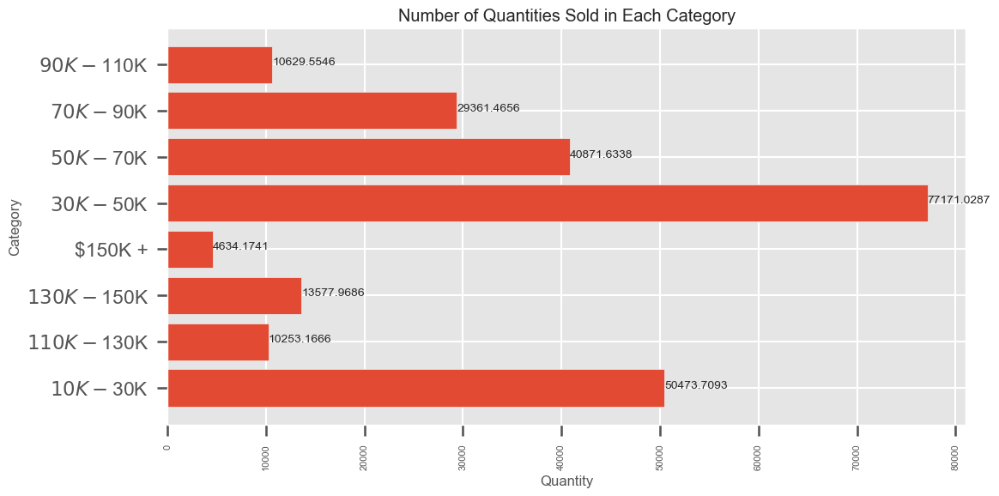

In [75]:
df_category_quantity = df.groupby('avg. yearly_income')['unit_sales'].sum().reset_index()
df_category_quantity.sort_values(by='unit_sales', ascending=False)
plt.figure(figsize=(12,6))
plt.barh(df_category_quantity[:10]['avg. yearly_income'], df_category_quantity[:10]['unit_sales'])

plt.xticks(rotation='vertical', size=8)
plt.xlabel('Quantity')
plt.ylabel('Category')
plt.title('Number of Quantities Sold in Each Category')
for index, value in enumerate(df_category_quantity[:10]['unit_sales']):
    plt.text(value, index,
             str(value))
plt.show()

# media type

In [76]:
store_type_relation = df.groupby("media_type")[["cost"]].mean().sort_values(by=['cost'],ascending=[False]).reset_index()
px.bar(store_type_relation, x= 'media_type', y="cost",color='media_type',color_discrete_sequence=px.colors.qualitative.Pastel1)

In [77]:
store_type_relation = df.groupby("media_type")[["unit_sales"]].mean().sort_values(by=['unit_sales'],ascending=[False]).reset_index()
px.bar(store_type_relation, x= 'media_type', y="unit_sales",color='media_type',color_discrete_sequence=px.colors.qualitative.Pastel1)

In [78]:
store_type_relation = df.groupby("media_type")[["cost"]].mean().sort_values(by=['cost'],ascending=[False]).reset_index()
px.bar(store_type_relation, x= 'media_type', y="cost",color='media_type',color_discrete_sequence=px.colors.qualitative.Pastel1)

cash register handout is the highest cost although the daily paper,radio is the highest frequency
we recommend to use TV and daily paper and radio more often

Text(0.5, 0.95, 'the highest media type according to cost in each country')

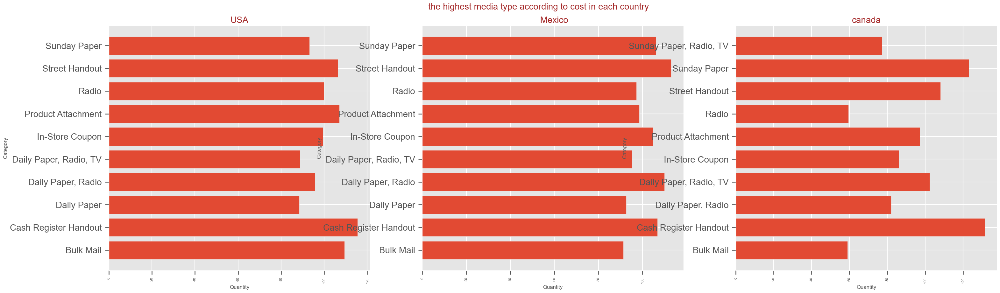

In [79]:
usa_store = df[df['sales_country']=="USA"]  
Mexico_store = df[df['sales_country']=="Mexico"]  
Canada_store = df[df['sales_country']=="Canada"] 
#Mid_Size_Grocery_store = data[data['store_type']=="Mid-Size Grocery"] 
#Small_Grocery_store = data[data['store_type']=="Small Grocery"] 
 
stores=["USA"," Mexico","canada"] 
fig, ax = plt.subplots(1,3, figsize=(36,10)) 
 
for i,store in enumerate([usa_store , Mexico_store, Canada_store]): 
    fig.sca(ax[i]) 
    df_category_quantity = store.groupby('media_type')['cost'].mean().reset_index() 
    df_category_quantity.sort_values(by='cost', ascending=False) 
    plt.barh(df_category_quantity[:10]['media_type'], df_category_quantity[:10]['cost']) 
 
    plt.xticks(rotation='vertical', size=8) 
    plt.yticks(size=20)
    plt.xlabel('Quantity') 
    plt.ylabel('Category') 
    plt.title('net salary of of each poromotion  in Each super market')
    plt.title(stores[i], fontsize=20,color='brown') 
fig.suptitle('the highest media type according to cost in each country',fontsize=20, color='brown', y=.95)

In [80]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.api.types import is_numeric_dtype
import plotly.express as px
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn import  metrics


from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import LinearRegression
from lightgbm import LGBMRegressor

import xgboost as xgb
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor

# Feature Engineering

# LABEL ENCODING

In [81]:
#["food_category",'food_department','food_family','promotion_name','sales_country','marital_status','gender','education','member_card','occupation','houseowner','avg. yearly_income','brand_name','store_type','store_city','store_state','media_type']
food_category_encoder = LabelEncoder()
df['food_category']= food_category_encoder.fit_transform(df['food_category'])

food_department_encoder = LabelEncoder()
df['food_department']= food_department_encoder.fit_transform(df['food_department'])

food_family_encoder = LabelEncoder()
df['food_family']= food_family_encoder.fit_transform(df['food_family'])

promotion_name_encoder = LabelEncoder()
df['promotion_name']= promotion_name_encoder.fit_transform(df['promotion_name'])

sales_country_encoder = LabelEncoder()
df['sales_country']= sales_country_encoder.fit_transform(df['sales_country'])

marital_status_encoder = LabelEncoder()
df['marital_status']= marital_status_encoder.fit_transform(df['marital_status'])

gender_encoder = LabelEncoder()
df['gender']= gender_encoder.fit_transform(df['gender'])

education_encoder = LabelEncoder()
df['education']= education_encoder.fit_transform(df['education'])

member_card_encoder = LabelEncoder()
df['member_card']= member_card_encoder.fit_transform(df['member_card'])

occupation_encoder = LabelEncoder()
df['occupation']= occupation_encoder.fit_transform(df['occupation'])

houseowner_encoder = LabelEncoder()
df['houseowner']= houseowner_encoder.fit_transform(df['houseowner'])

yearly_income_encoder = LabelEncoder()
df['avg. yearly_income_no_dollar']= yearly_income_encoder.fit_transform(df['avg. yearly_income_no_dollar'])

brand_name_encoder = LabelEncoder()
df['brand_name']= brand_name_encoder.fit_transform(df['brand_name'])

store_type_encoder = LabelEncoder()
df['store_type']= store_type_encoder.fit_transform(df['store_type'])

store_city_encoder = LabelEncoder()
df['store_city']= store_city_encoder.fit_transform(df['store_city'])

store_state_encoder = LabelEncoder()
df['store_state']= store_state_encoder.fit_transform(df['store_state'])

media_type_encoder = LabelEncoder()
df['media_type']= media_type_encoder.fit_transform(df['media_type'])
#final_data = encoder.fit_transform(df.drop(columns='cost'))


In [82]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60428 entries, 0 to 60427
Data columns (total 42 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   food_category                 60428 non-null  int32  
 1   food_department               60428 non-null  int32  
 2   food_family                   60428 non-null  int32  
 3   store_sales(in millions)      60428 non-null  float64
 4   store_cost(in millions)       60428 non-null  float64
 5   unit_sales(in millions)       60428 non-null  float64
 6   promotion_name                60428 non-null  int32  
 7   sales_country                 60428 non-null  int32  
 8   marital_status                60428 non-null  int32  
 9   gender                        60428 non-null  int32  
 10  total_children                60428 non-null  float64
 11  education                     60428 non-null  int32  
 12  member_card                   60428 non-null  int32  
 13  o

# Train Test Split

In [83]:
x = df.drop(columns=['cost',"unit_sales","avg. yearly_income"])
y = df['cost']

In [84]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3)

In [85]:
x_train.shape

(42299, 39)

# Modeling

# Linear Regression

In [86]:
df.dtypes

food_category                     int32
food_department                   int32
food_family                       int32
store_sales(in millions)        float64
store_cost(in millions)         float64
unit_sales(in millions)         float64
promotion_name                    int32
sales_country                     int32
marital_status                    int32
gender                            int32
total_children                  float64
education                         int32
member_card                       int32
occupation                        int32
houseowner                        int32
avg_cars_at home(approx)        float64
avg. yearly_income               object
num_children_at_home            float64
avg_cars_at home(approx).1      float64
brand_name                        int32
SRP                             float64
gross_weight                    float64
net_weight                      float64
recyclable_package              float64
low_fat                         float64


In [87]:
lr = LinearRegression()
lr.fit(x_train,y_train)
print('Attempting to fit Linear Regressor')

Attempting to fit Linear Regressor


In [88]:
y_pred_val_lr = lr.predict(x_test)
print('MAE on Validation set :',metrics.mean_absolute_error(y_test, y_pred_val_lr))
print("\n")
print('MSE on Validation set :',metrics.mean_squared_error(y_test, y_pred_val_lr))
print("\n")
print('RMSE on Validation set :',np.sqrt(metrics.mean_absolute_error(y_test, y_pred_val_lr)))
print("\n")
print('R2 Score on Validation set :',metrics.r2_score(y_test, y_pred_val_lr))
print("\n")


MAE on Validation set : 25.14564209094199


MSE on Validation set : 861.6255972458415


RMSE on Validation set : 5.014543059037582


R2 Score on Validation set : 0.03144939577752526


